# Table of Contents

- [Torus](#Torus)
- [Settings and Helper Functions](#Settings-and-Helper-Functions)
- [Algorithm](#Algorithm)
- [Functions to Transform Coordinates](#Functions-to-Transform-Coordinates)
- [Diagnostics](#Diagnostics)
- [Reverse Engineering Failures](#Reverse-Engineering-Failures)

# Torus

Manifold
$$
\mathbb{T}^2 :=\left\{(x,y,z)\in \mathbb{R}^3\,:\, q(x, y, z) = 0\right\}
$$
Constraint function
$$
q(x, y, z) = \left(\sqrt{(x-x_0)^2+(y-y_0)^2} - R\right)^2 + (z - z_0)^2 - r^2
$$


Jacobian / gradient
$$
J_q(x,y,z) = 
\begin{pmatrix}
    \frac{2(x-x_0)\left(\sqrt{(x-x_0)^2+(y-y_0)^2}-R\right)}{\sqrt{(x-x_0)^2+(y-y_0)^2}} \\
    \frac{2(y-y_0)\left(\sqrt{(x-x_0)^2+(y-y_0)^2}-R\right)}{\sqrt{(x-x_0)^2+(y-y_0)^2}} \\
    2(z - z_0)
\end{pmatrix}
$$

Cartesian Representation

$$
\begin{align}
    x &= x_0 + (R + r\cos\theta)\cos\phi \\
    y &= y_0 + (R + r\cos\theta)\sin\phi \\
    z &= z_0 + r\sin\theta
\end{align}
$$

Tangent basis from parametric representation

# Settings and Helper Functions

In [1]:
import numpy as np
from numpy.random import randn
import matplotlib.pyplot as plt
from numpy import pi
from scipy.stats import multivariate_normal, norm
import matplotlib.cm as cm
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches
from scipy.optimize import root
from mpl_toolkits.mplot3d import Axes3D
from numpy.linalg import qr, svd
import plotly.express as px
import plotly.graph_objects as go

In [2]:
R = 1                            # Toroidal radius
r = 0.5                          # Polar radius
n = int(1e5)                     # Number of samples
m = 1                            # Number of constraints
d = 2                            # Dimension of manifold
mu = np.array([0.0, 0.0, 0.0])   # Center of the torus
theta = 3.5                      # θ for initial point on the sphere
phi = 3.5                        # ϕ for initial point on the sphere
sigma = 0.5                      # σ scaling for proposal
tol = 1.48e-08                   # tolerance for root finding algorithm
a_guess = 1                      # initial guess for root-finding algorithm
maxiter = 10
use_their_project = False

In [3]:
# TORUS
def to_cartesian(theta_phi):
    """[θ, ϕ] --> [x, y, z]"""
    theta, phi = theta_phi[0], theta_phi[1]
    x = mu[0] + (R + r * np.cos(theta)) * np.cos(phi)
    y = mu[1] + (R + r * np.cos(theta)) * np.sin(phi)
    z = mu[2] + r * np.sin(theta)
    return np.array([x, y, z])

# TORUS
def grad(xyz):
    """Q"""
    xc, yc, zc = xyz - mu
    return np.array([
        2 * xc * (np.sqrt(xc**2 + yc**2) - R) / np.sqrt(xc**2 + yc**2),
        2 * yc * (np.sqrt(xc**2 + yc**2) - R) / np.sqrt(xc**2 + yc**2),
        2 * zc
    ])

# ANY
def tangent_basis(Q):
    """Given the Q matrix (the gradient) computes a basis for the tagent space it is normal to via SVD"""
    U = svd(Q.reshape(-1, m))[0]
    return U[:, m:]   # contains 2 columns. Each column is a basis

# ANY
def normalize(x):
    """Returns x as a unit vector"""
    return x / np.sqrt(np.sum(x**2))

# ANY
def project(x, v, Q, tol=None, a_guess=1, maxiter=maxiter):
    """Finds a such that q(x + v + a*Q) = 0"""
    opt_output = root(lambda a: q(x + v + a*Q), a_guess, tol=tol)
    return (opt_output.x, opt_output.success) # output flag for accept/reject

# ANY
def logf(x):
    """Implements the target distribution on the manifold"""
    # In our case, it's the uniform distribution
    return 0

# ANY
def log_proposal(v):
    """Computes log density of the proposal. Right now its a gaussian"""
    return multivariate_normal.logpdf(v, mean=np.zeros(d), cov=(sigma**2)*np.eye(d))

# TORUS
def q(xyz):
    """Constraint function for the sphere"""
    xc, yc, zc = xyz - mu   # center
    return (np.sqrt(xc**2 + yc**2) - R)**2 + zc**2 - r**2

def jacobian_newton(x, v, a, Q):
    """Jacobian for newton's method"""
    return np.dot(grad(x + v + a*Q), Q)

def project2(x, v, Q, tol=tol, a_guess=1, maxiter=maxiter):
    """Project, but their version"""
    a = 0
    i = 0
    flag = 1
    while np.sqrt(np.sum(q(x + v + a*Q)**2)) > tol:
        delta_a = jacobian_newton(x,v,a,Q) / -q(x+v+a*Q)
        a += delta_a
        i += 1
        if i > maxiter:
            flag = 0
            return a, flag
    return a, flag    

if use_their_project:
    project = project2

# Algorithm

In [4]:
# Initial point on the sphere
x = to_cartesian(np.array([theta, phi]))

# Store the n sampes on the manifold
samples = np.zeros((n, d+m))
samples[0, :] = x
i = 1

# Sample log-uniform variates for MH accept/reject step
logu = np.log(np.random.rand(n))

while i < n:
    
    # Compute gradient and bases at x
    Qx = grad(x)                 # Gradient at x (3,), 
    gx_basis = normalize(Qx)     # ON basis for gradient (3,)
    tx_basis = tangent_basis(Qx) # ON basis for tangent space at x using SVD (3, 2)
    
    # Sample along tangent
    v_sample = sigma*randn(d) # MVN with scaling σ
    v = tx_basis @ v_sample   # Multiply each basis vector with each MVN sample
    
    # Forward Projection
    a, flag = project(x, v, Qx, tol, a_guess)
    if flag == 0:              # Projection failed
        samples[i, :] = x      # Stay at x
        i += 1
        continue
    y = x + v + a*Qx           # Compute projected point
    
    # Compute v' and w' from y
    Qy = grad(y)                        # Gradient at y (3, )
    gy_basis = normalize(Qy)            # ON basis for gradient (3, )
    ty_basis = tangent_basis(Qy)        # ON basis for tangent space at y using SVD (3, 2)
    v_prime_sample = (x - y) @ ty_basis # Components along tangent
        
    # Metropolis-Hastings
    if logu[i] > logf(y) + log_proposal(v_prime_sample) - logf(x) - log_proposal(v_sample):
        samples[i, :] = x      # Reject, stay at x
        i += 1
        continue
    
    # Backward Projection
    v_prime = v_prime_sample @ ty_basis.T
    a_prime, flag = project(y, v_prime, Qy, tol, a_guess)
    if flag == 0:
        samples[i, :] = x     # projection failed, stay at x
        i += 1
        continue
        
    # Accept move
    x = y
    samples[i, :] = x
    i +=1

In [5]:
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=samples[:,0], 
            y=samples[:,1], 
            z=samples[:,2], 
            mode="markers",
            marker=dict(
                size=1.0,
                opacity=0.8
            ))
    ]
)
fig.show()

# Functions to Transform Coordinates

In [6]:
def correct_arctan(y, x):
    return (2*np.pi + np.arctan2(y, x)) % (2*np.pi)

In [13]:
def find_theta(xyz):
    """If you are on the outside, you have to shift [-pi/2, pi/2] to [0, pi/2] U [3pi/2, 2pi].
    If you are on the inside, you have to shift [-pi/2, pi/2] to [pi/2, pi] U [pi, 3pi/2]"""
    x, y, z = xyz
    if (x**2 + y**2) >= R**2:
        return (np.arcsin(z/r) + 2*np.pi) % (2*np.pi)
    else:
        return np.pi - np.arcsin(z/r)

# Diagnostics

In [14]:
c_samples = samples - mu                                       # Center the samples 
thin = 1                                                       # Thinning 
angles_for_plot = np.linspace(0, 2*np.pi + (2*np.pi)/100, 100) # Angles used in the x axis of the plots below
bins=60                                                        # For Histogram

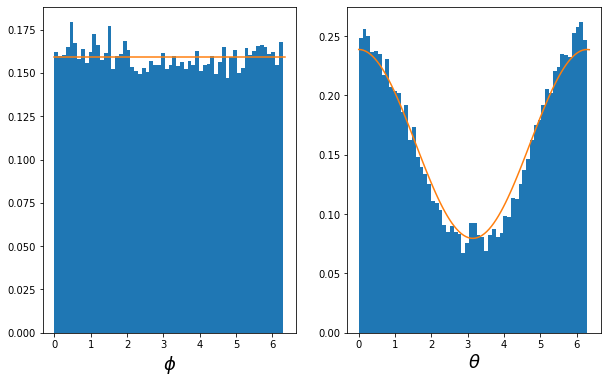

In [15]:
fig, ax = plt.subplots(ncols=2, figsize=(10, 6))

# ϕ Histogram
_ = ax[0].hist(correct_arctan(c_samples[:, 1], c_samples[:, 0])[::thin], bins=bins, density=True)
ax[0].plot(angles_for_plot, np.repeat(1/(2*np.pi), 100))

# θ Histogram & Density
_ = ax[1].hist(np.apply_along_axis(find_theta, 1, c_samples)[::thin], bins=bins, density=True)
ax[1].plot(angles_for_plot, (1 + (r/R)*np.cos(angles_for_plot))/(2*np.pi))

ax[0].set_xlabel(r"$\phi$", fontsize=18)
ax[1].set_xlabel(r"$\theta$", fontsize=18)
plt.show()

# Reverse Engineering Failures

In [34]:
xx = to_cartesian([np.pi, 3.5])

In [35]:
Qxx = grad(xx)                 # Gradient at x (3,), 
Qxx

array([9.36456687e-01, 3.50783228e-01, 1.22464680e-16])

In [36]:
gxx_basis = normalize(Qxx)     # ON basis for gradient (3,)
txx_basis = tangent_basis(Qxx) # ON basis for tangent space at x using SVD (3, 2)

In [37]:
gxx_basis

array([9.36456687e-01, 3.50783228e-01, 1.22464680e-16])

In [38]:
txx_basis

array([[-3.50783228e-01, -1.22464680e-16],
       [ 9.36456687e-01, -2.21841036e-17],
       [-2.21841036e-17,  1.00000000e+00]])

In [39]:
v_sample = sigma*randn(d) # MVN with scaling σ
v = txx_basis @ v_sample   # Multiply each basis vector with each MVN sample

In [40]:
v_sample, v

(array([0.31490496, 0.50378279]),
 array([-0.11046338,  0.29489486,  0.50378279]))

In [41]:
a, flag = project(xx, v, Qxx, tol, a_guess)

In [42]:
a, flag

(array([1.44910409]), False)

In [43]:
yy = xx + v + a*Qxx   

In [44]:
yy

array([0.7783315 , 0.62782465, 0.50378279])

In [45]:
# Compute v' and w' from y
Qyy = grad(yy)                        # Gradient at y (3, )

In [46]:
Qyy

array([-2.82421808e-05, -2.27809582e-05,  1.00756558e+00])

In [47]:
gyy_basis = normalize(Qyy)            # ON basis for gradient (3, )
tyy_basis = tangent_basis(Qyy)        # ON basis for tangent space at y using SVD (3, 2)
v_prime_sample = (xx - yy) @ tyy_basis # Components along tangent

In [48]:
gyy_basis

array([-2.80301166e-05, -2.26099011e-05,  9.99999999e-01])

In [49]:
tyy_basis

array([[-2.26099011e-05,  9.99999999e-01],
       [ 9.99999999e-01,  2.26092674e-05],
       [ 2.26092674e-05,  2.80306278e-05]])

In [50]:
v_prime_sample

array([-0.80319947, -1.24659212])

In [51]:
# rejected?
np.log(np.random.rand()) > logf(y) + log_proposal(v_prime_sample) - logf(x) - log_proposal(v_sample)

True

In [52]:
log_proposal(v_prime_sample), log_proposal(v_sample)

(-4.849825327072649, -1.157507174064886)

In [53]:
np.exp(log_proposal(v_prime_sample)), np.exp(log_proposal(v_sample))

(0.007829745074280029, 0.31426862220443325)

Generate a grid of points as the tangent space at x

In [54]:
txx_basis

array([[-3.50783228e-01, -1.22464680e-16],
       [ 9.36456687e-01, -2.21841036e-17],
       [-2.21841036e-17,  1.00000000e+00]])

In [55]:
# Plane tangent to x
top=0.5
bot=-0.5
nnn = 50
x__ = np.linspace(bot, top, nnn)
y__ = np.linspace(bot, top, nnn)
x__, y__ = np.meshgrid(x__, y__)
x__ = x__.flatten()
y__ = y__.flatten()
xy__ = np.hstack((x__.reshape(-1, 1), y__.reshape(-1, 1)))
tot = np.zeros((len(xy__), 3))
for i in range(len(xy__)):
    tot[i, :] = txx_basis @ xy__[i]

In [56]:
TT = PP = np.linspace(0, 2*np.pi, 100)
TT, PP = np.meshgrid(TT, PP)
TTPP = np.hstack((TT.reshape(-1,1), PP.reshape(-1, 1)))
xyz = np.apply_along_axis(to_cartesian, 1, TTPP)

In [57]:
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=xyz[:,0], 
            y=xyz[:,1], 
            z=xyz[:,2], 
            mode="markers",
            name="Torus",
            marker=dict(
                size=1.0,
                opacity=0.8
            )),
        go.Scatter3d(
            x=[xx[0]],
            y=[xx[1]],
            z=[xx[2]],
            mode="markers",
            marker=dict(
                size=8.0
            ),
            name="Current x"
        ),
        go.Scatter3d(
            x=[v[0]],
            y=[v[1]],
            z=[v[2]],
            mode="markers",
            name="Tangent Sample v",
            marker=dict(
                size=8.0,
                color="green"
            )
        ),
        go.Scatter3d(
            x=[yy[0]],
            y=[yy[1]],
            z=[yy[2]],
            mode="markers",
            name="Projected y",
            marker=dict(
                size=8.0,
                color="blue"
            )
        ),
        go.Scatter3d(
            x=tot[:, 0],
            y=tot[:, 1],
            z=tot[:, 2],
            mode="markers",
            name="Tx",
            marker=dict(
                size=3.0,
                color="orange"
            )
        )
    ]
)
fig.show()